In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
%config InlineBackend.figure_format = 'retina'

# Part 1

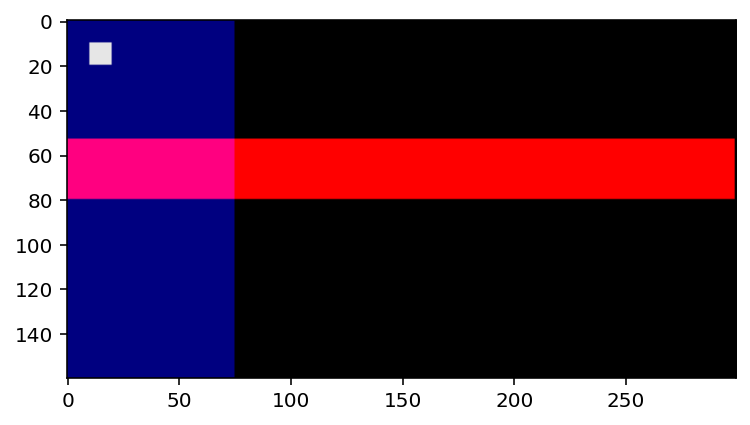

In [2]:
maxX=300
maxY=160
A = np.zeros([maxY,maxX,3],dtype='uint8') 
A[maxY//3:maxY//2 , 0:maxX-1, 0] = 255 
A[0:maxY          , 0:maxX//4,2] = 128 
A[ 10:20, 10:20,:] = 230 
 
plt.imshow(A) 
plt.show() 
io.imsave('almost_a_flag.jpg',A)

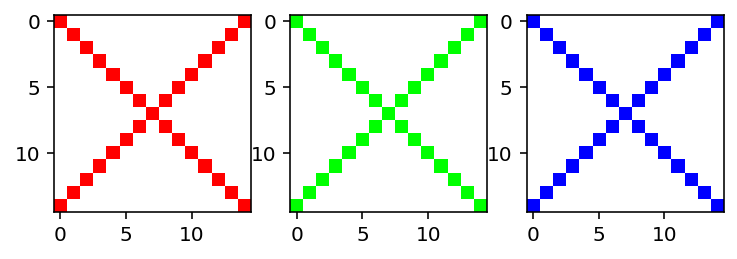

In [3]:
maxX = 15; maxY = 15; 
A = 255 * np.ones([maxY,maxX,3],dtype='uint8')
B = 255 * np.ones([maxY,maxX,3],dtype='uint8')
C = 255 * np.ones([maxY,maxX,3],dtype='uint8')

for i in range(maxX):
    A[i,i,2]=0
    A[i,i,1]=0
    A[maxY-i-1,i,2]=0
    A[maxY-i-1,i,1]=0
    
    C[i,i,0]=0
    C[i,i,1]=0
    C[maxY-i-1,i,0]=0
    C[maxY-i-1,i,1]=0
    
    B[i,i,2]=0
    B[i,i,0]=0
    B[maxY-i-1,i,2]=0
    B[maxY-i-1,i,0]=0

fig1, axs = plt.subplots(1,3)
axs[0].imshow(A)
axs[1].imshow(B)
axs[2].imshow(C)

# Part 2

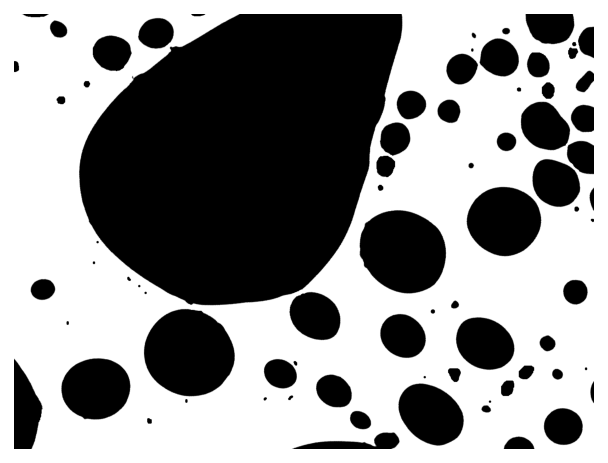

In [4]:
image = io.imread('lab12_image_processing/2.jpg')
plt.axis('off') # turn off axis labels 
plt.imshow(image, cmap='gray') 
plt.show() 

In [5]:
def PrintArrayInfo(a): 
    print("Array info:") 
    print("shape:", a.shape) 
    print("dtype:", a.dtype) 
    print("min, max:", a.min(), a.max()) 

In [6]:
PrintArrayInfo(image)

Array info:
shape: (960, 1280)
dtype: uint8
min, max: 0 255


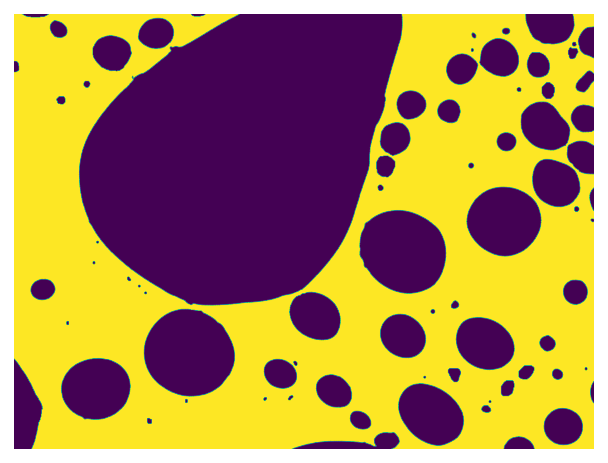

In [7]:
plt.axis('off') # turn off axis labels 
plt.imshow(image) 
plt.show()

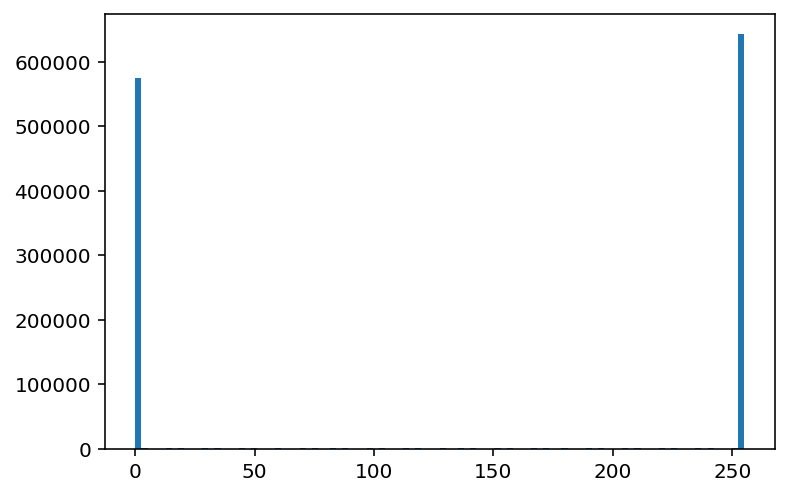

In [8]:
plt.hist(image.ravel(),100) 
plt.show() 

In [9]:
val = 50  
image_bw1 = (image >  val) 
image_bw2 = (image <= val)

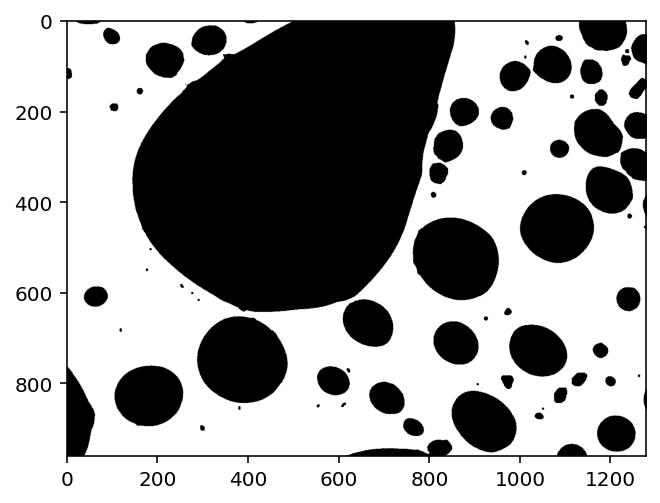

In [10]:
plt.imshow(image_bw1,cmap='gray')

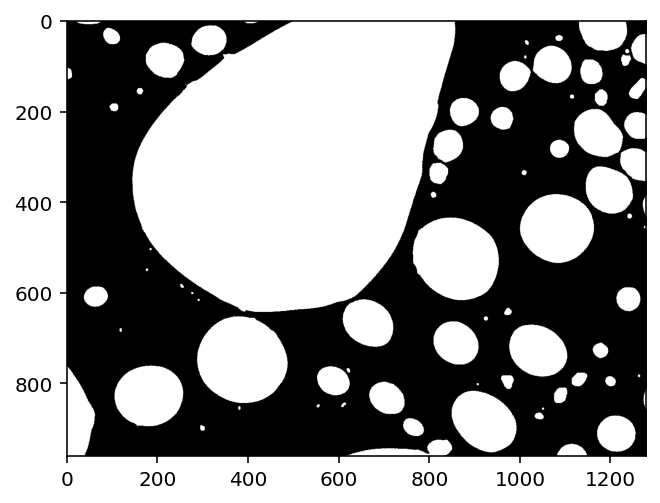

In [11]:
plt.imshow(image_bw2,cmap='gray')

In [12]:
PrintArrayInfo(image_bw1)

Array info:
shape: (960, 1280)
dtype: bool
min, max: False True


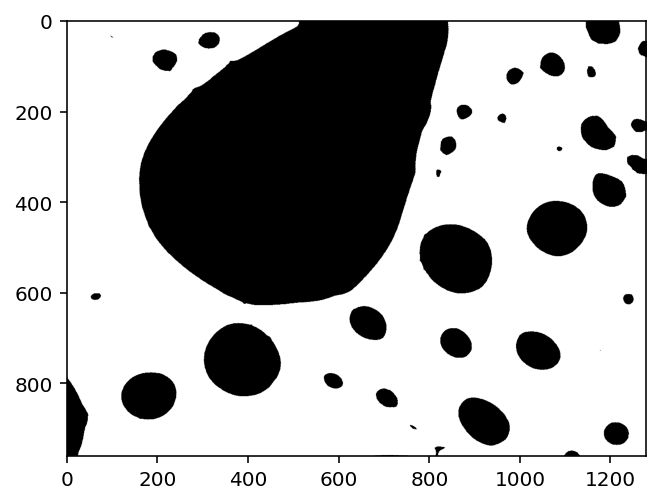

In [13]:
from skimage.morphology import disk, erosion, dilation, opening, closing 
selector = disk(15)
image_morph1 = dilation(image_bw1, selector) 
image_morph2 = erosion(image_bw2, selector)

plt.imshow(image_morph1,cmap='gray') 

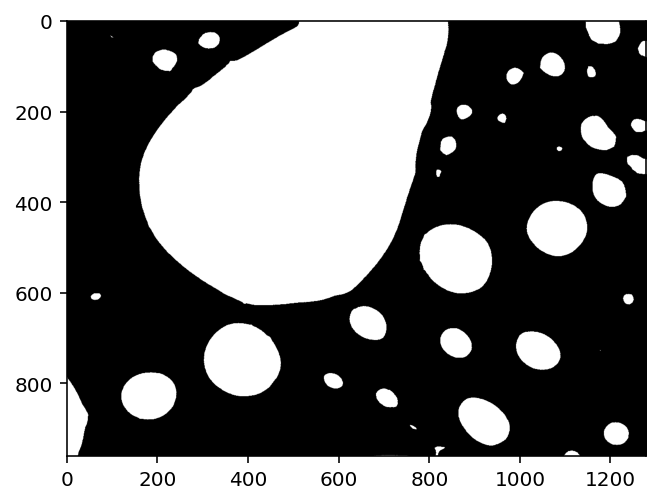

In [14]:
plt.imshow(image_morph2,cmap='gray') 
plt.show()

In [15]:
from skimage import measure 
image_morph_best=image_morph2
labels = measure.label(image_morph_best) 
print(np.unique(labels)) 
PrintArrayInfo(labels)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]
Array info:
shape: (960, 1280)
dtype: int32
min, max: 0 39


<ipython-input-16-e062f2f043c6>:2: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  image_label_overlay = label2rgb(labels, image=image_morph_best)


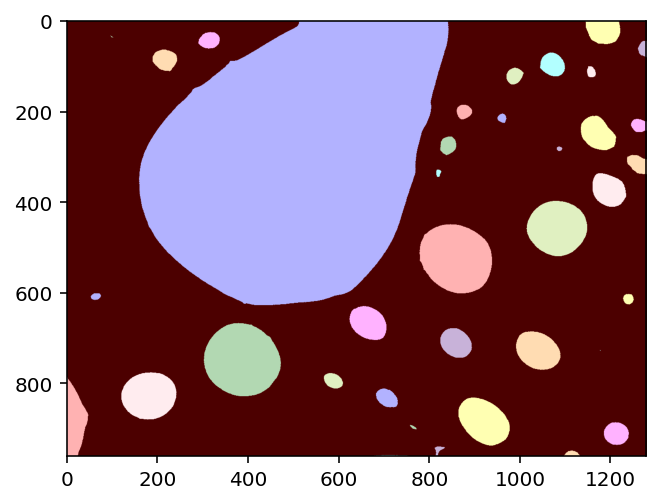

In [16]:
from skimage.color import label2rgb 
image_label_overlay = label2rgb(labels, image=image_morph_best) 
plt.imshow(image_label_overlay) 
plt.show() 

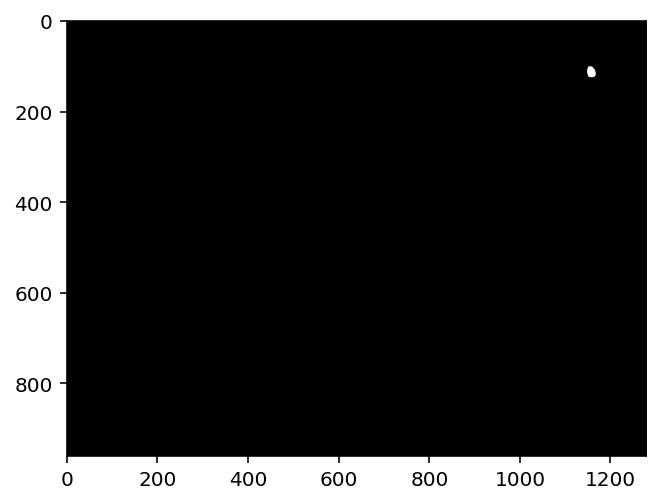

In [17]:
props = measure.regionprops(labels) 
 
# select the 8th region 
bubble = props[7] 
 
# get the coordinates of the bubble 
x1, y1, x2, y2 = bubble.bbox 
 
# Make a new image with the dimensions of the original one 
img = np.zeros(image_morph_best.shape,dtype=bool) 
 
# place the bubble image in the correct location in the new image 
img[x1:x2,y1:y2] = bubble.image 
plt.imshow(img,cmap='gray') 
plt.show() 

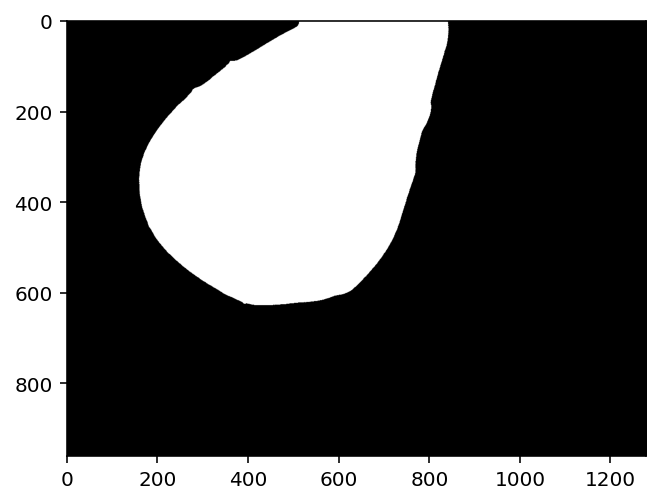

In [18]:
areas=[]
img = np.zeros(image_morph_best.shape,dtype=bool) 

for p in props:
    areas.append(p.area)
    if p.area==max(areas):
        bubble=p
        x1, y1, x2, y2 = bubble.bbox 
        img[x1:x2,y1:y2] = bubble.image
plt.imshow(img,cmap='gray') 
plt.show() 

# Part 3

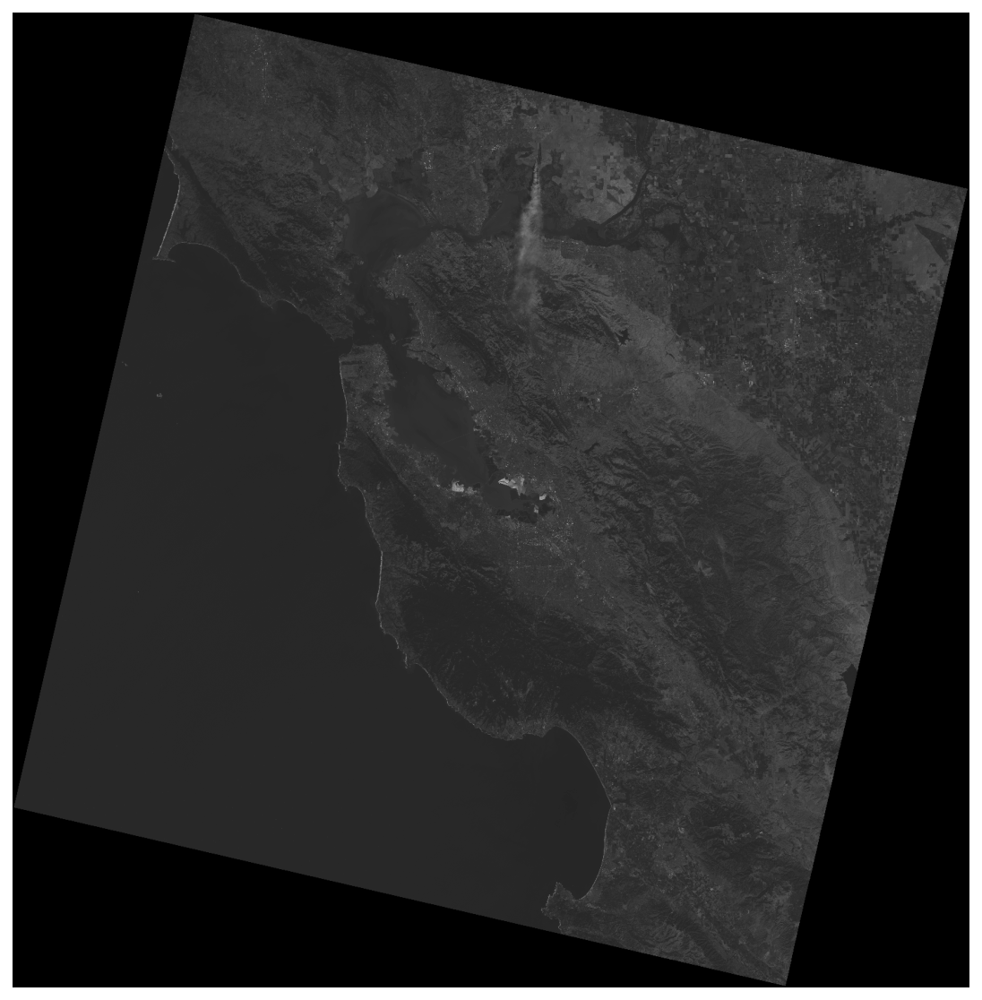

In [19]:
# load in the band  
ls_red = io.imread('lab12_image_processing/landsat_band'+str(4)+'.tif') 
 
# plot the band using matplotlib 
fig, ax = plt.subplots(1, 1, figsize=(10, 10)) 
plt.axis('off') 
plt.imshow(ls_red,cmap='gray') 
plt.show() 

In [20]:
PrintArrayInfo(ls_red)

Array info:
shape: (1500, 1473)
dtype: uint16
min, max: 0 39344


In [21]:
from skimage import img_as_ubyte, img_as_uint, img_as_float64 
ls_red = img_as_float64(ls_red) 
PrintArrayInfo(ls_red) 

Array info:
shape: (1500, 1473)
dtype: float64
min, max: 0.0 0.600350957503624


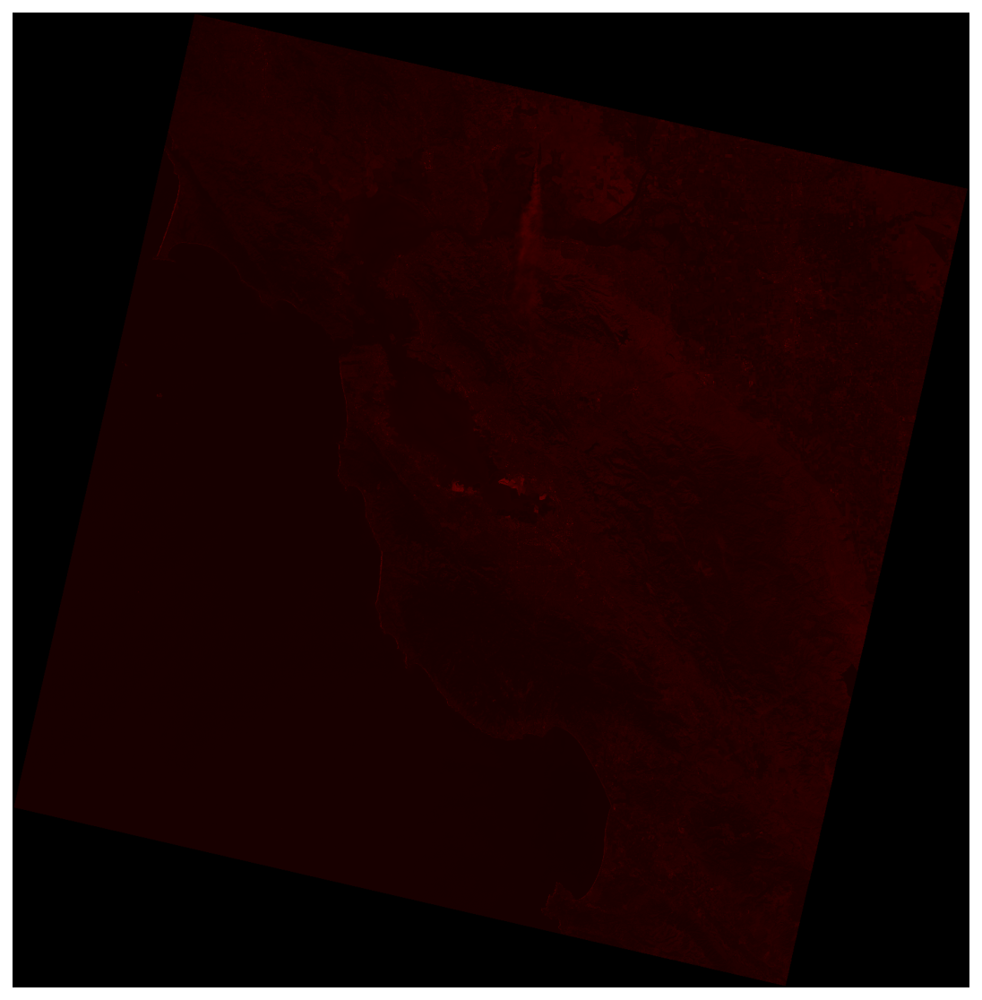

In [22]:
nx,ny = ls_red.shape 
red_only = np.zeros([nx,ny,3],dtype=np.float64)

red_only[0:nx,0:ny,0]=ls_red[0:nx,0:ny]

fig, ax = plt.subplots(1, 1, figsize=(10, 10)) 
plt.axis('off') 
plt.imshow(red_only) 
plt.show()

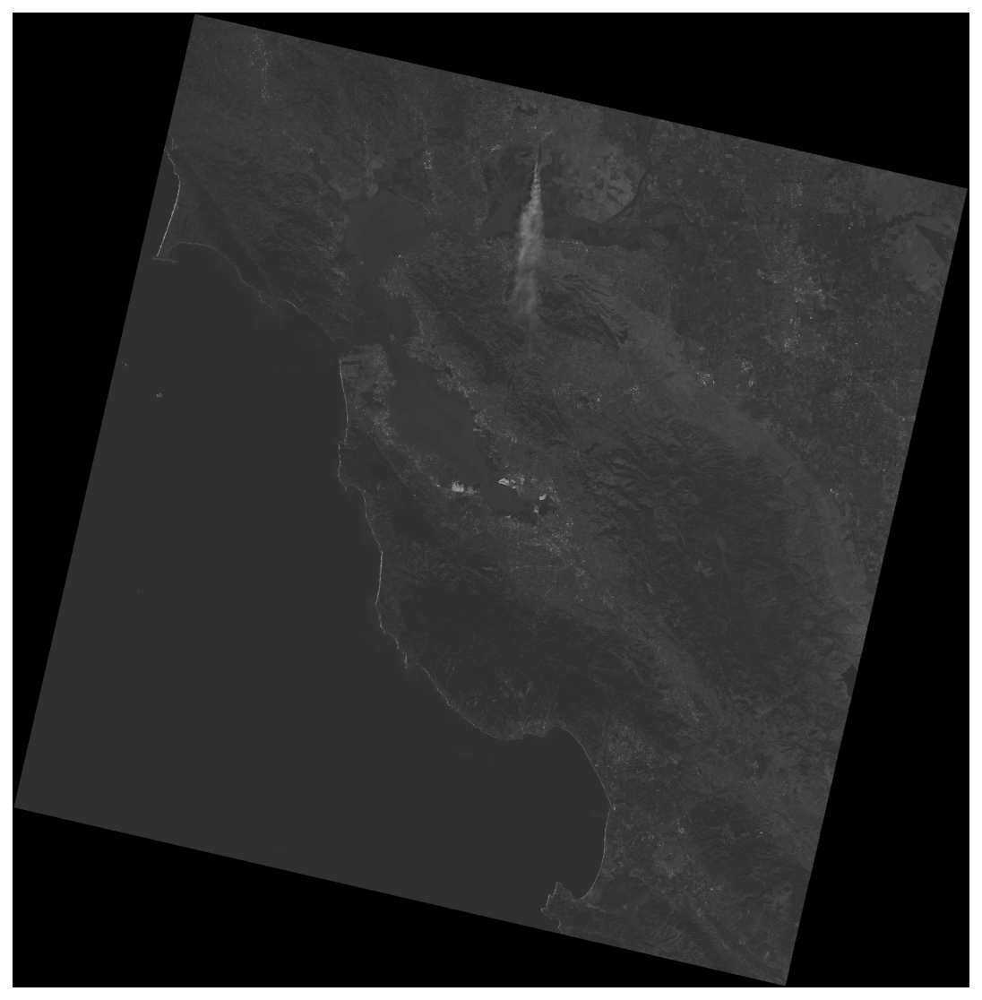

In [23]:
# load in the band  
ls_green = io.imread('lab12_image_processing/landsat_band'+str(3)+'.tif') 
 
# plot the band using matplotlib 
fig, ax = plt.subplots(1, 1, figsize=(10, 10)) 
plt.axis('off') 
plt.imshow(ls_green,cmap='gray') 
plt.show() 

In [24]:
PrintArrayInfo(ls_green)

Array info:
shape: (1500, 1473)
dtype: uint16
min, max: 0 36175


In [25]:
ls_green = img_as_float64(ls_green) 
PrintArrayInfo(ls_green) 

Array info:
shape: (1500, 1473)
dtype: float64
min, max: 0.0 0.5519951171129931


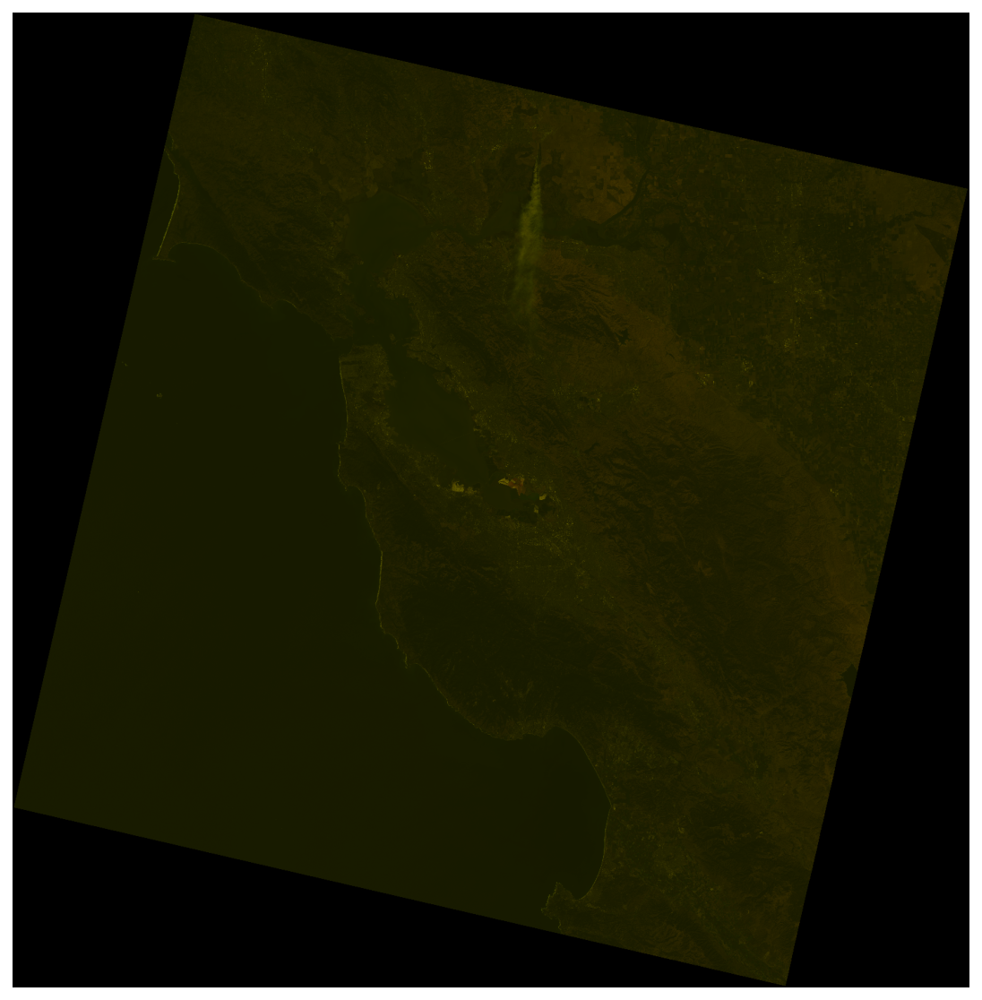

In [26]:
red_only[0:nx,0:ny,1]=ls_green[0:nx,0:ny]

fig, ax = plt.subplots(1, 1, figsize=(10, 10)) 
plt.axis('off') 
plt.imshow(red_only) 
plt.show()

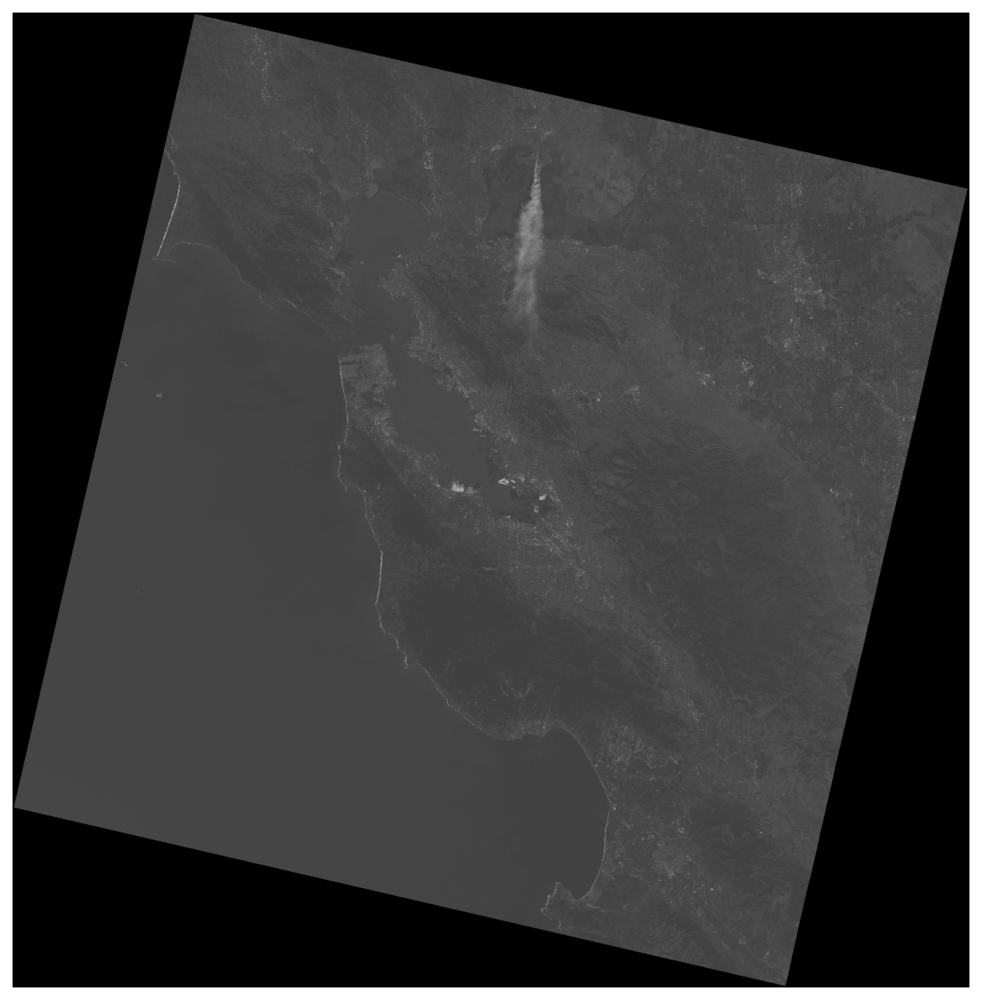

In [27]:
# load in the band  
ls_blue = io.imread('lab12_image_processing/landsat_band'+str(2)+'.tif') 
 
# plot the band using matplotlib 
fig, ax = plt.subplots(1, 1, figsize=(10, 10)) 
plt.axis('off') 
plt.imshow(ls_blue,cmap='gray') 
plt.show() 

In [28]:
PrintArrayInfo(ls_blue)

Array info:
shape: (1500, 1473)
dtype: uint16
min, max: 0 30608


In [29]:
ls_blue = img_as_float64(ls_blue) 
PrintArrayInfo(ls_blue) 

Array info:
shape: (1500, 1473)
dtype: float64
min, max: 0.0 0.4670481422140841


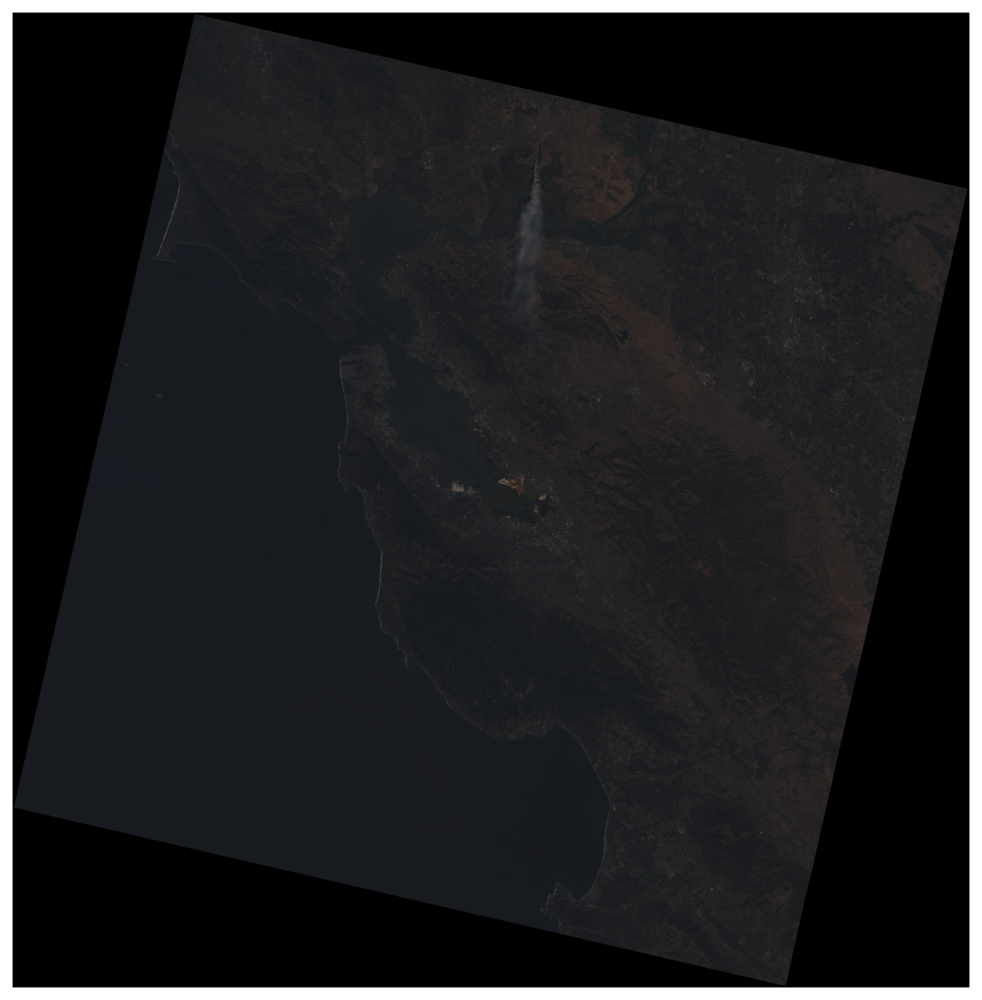

In [30]:
red_only[0:nx,0:ny,2]=ls_blue[0:nx,0:ny]
ls_rgb=red_only
fig, ax = plt.subplots(1, 1, figsize=(10, 10)) 
plt.axis('off') 
plt.imshow(ls_rgb) 
plt.show()

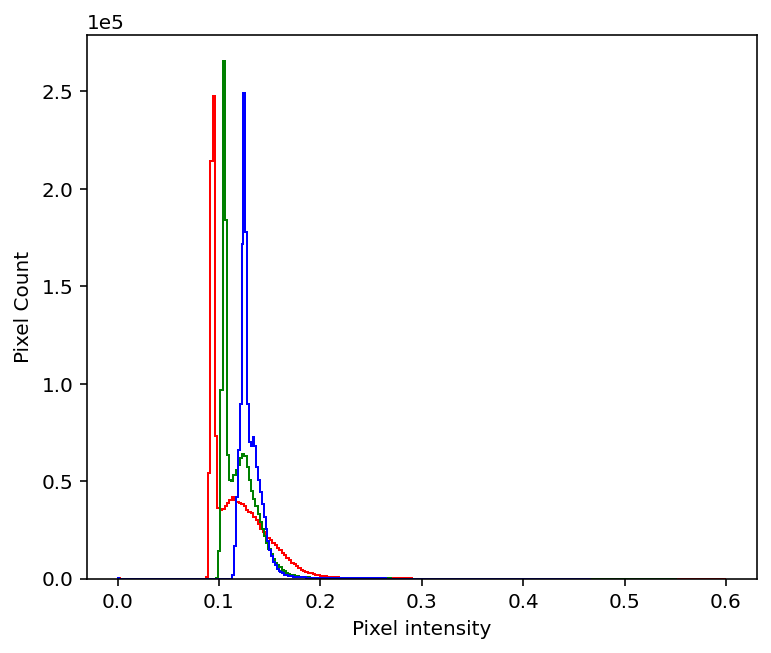

In [32]:
from image_manipulation import plot_channel_intensities 
     
plot_channel_intensities(ls_rgb) 
plt.show()

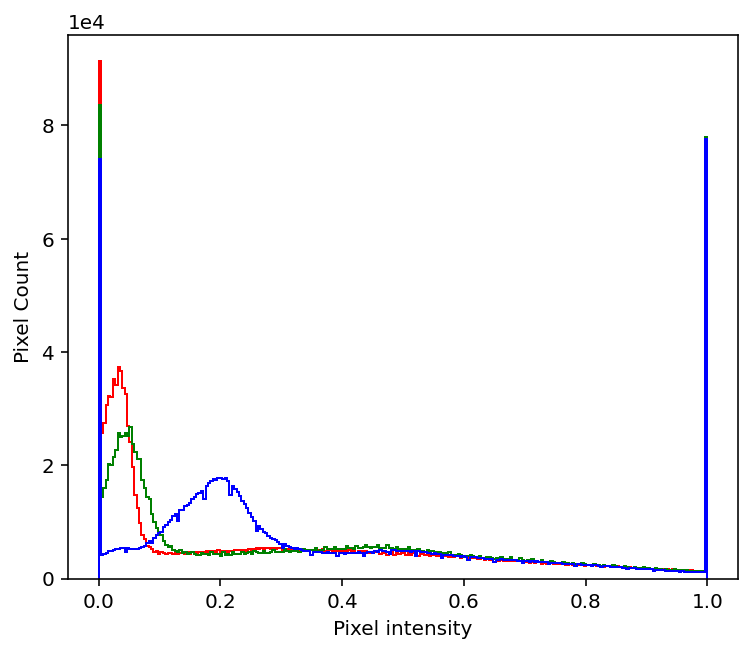

In [33]:
from image_manipulation import rescale_intensities 
 
flow = 5 
fhigh = 95 
 
ls_rgb_rescale = rescale_intensities(ls_rgb,flow,fhigh) 
plot_channel_intensities(ls_rgb_rescale) 
plt.show() 

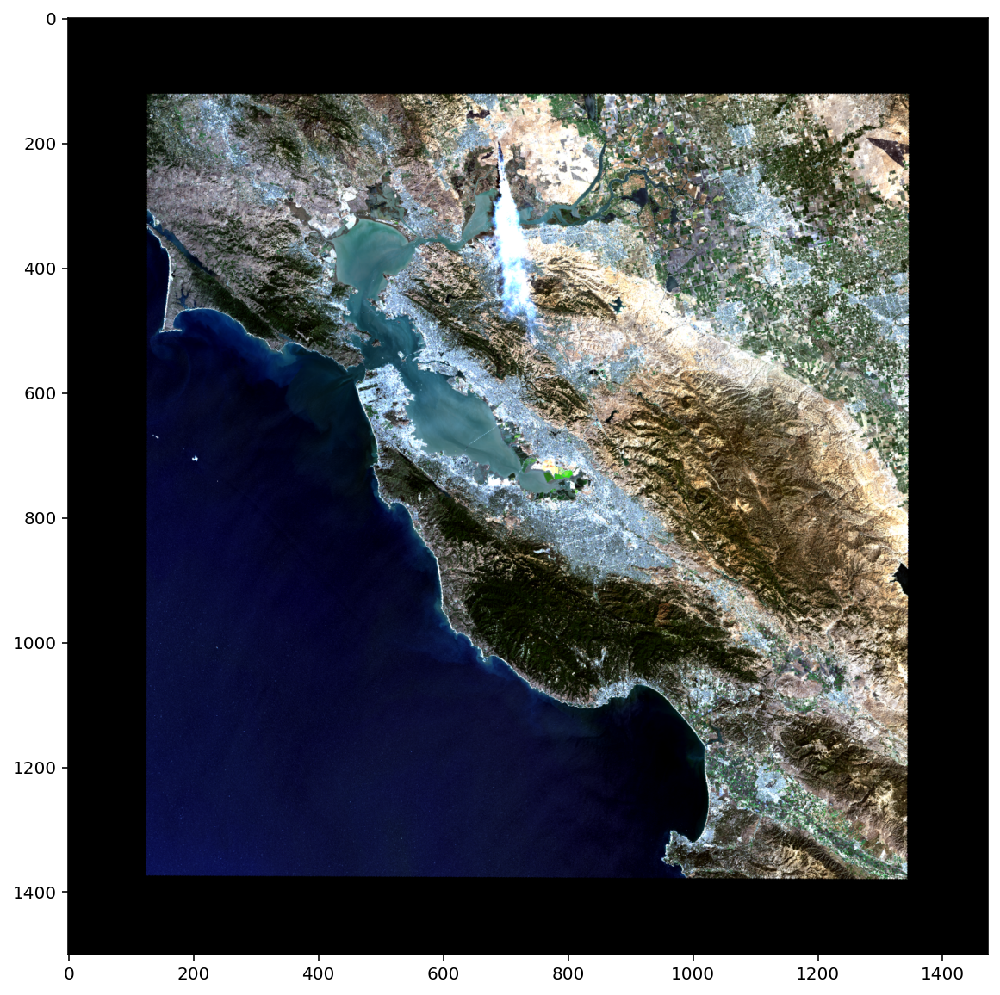

In [34]:
from skimage.transform import rotate 
 
angle=12.75
image = ls_rgb_rescale 
image_rot = rotate(image, angle)

plt.figure(figsize=(10,10))
plt.imshow(image_rot)

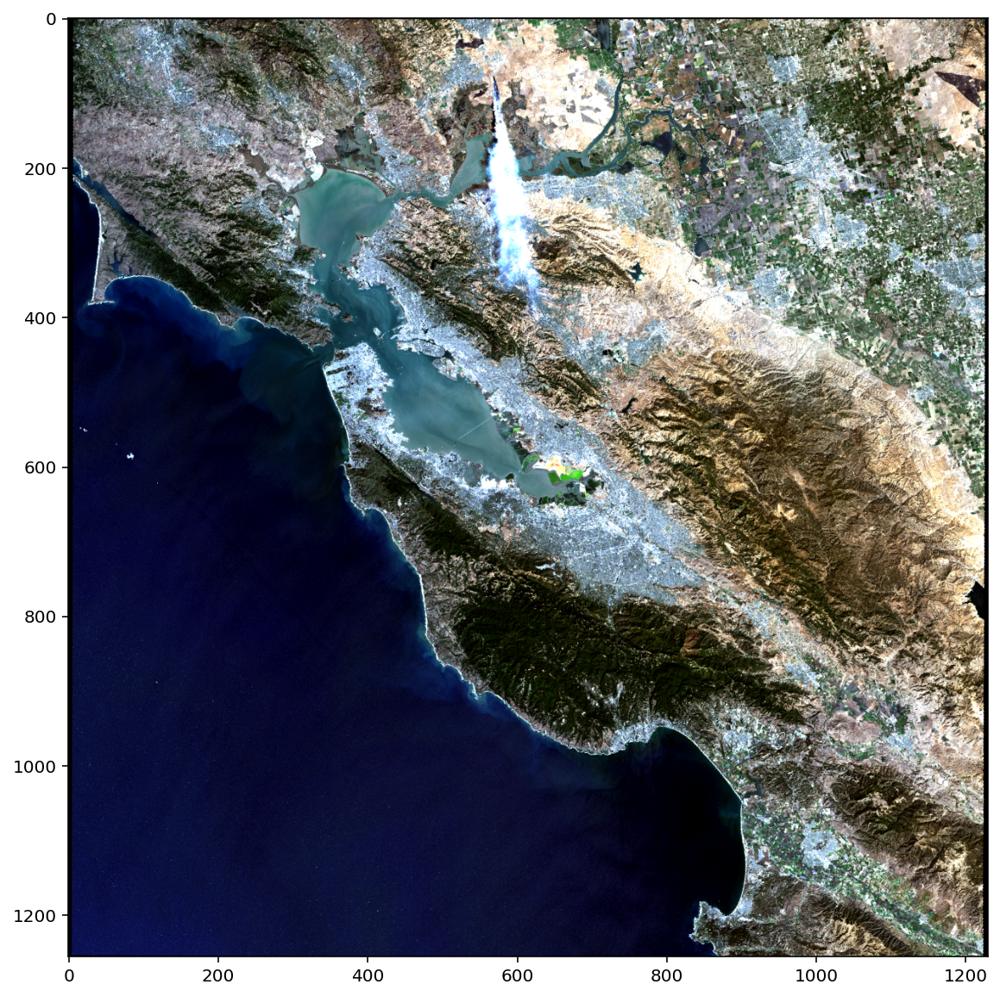

In [35]:
image = image_rot 
image_crop = image[120:1375,120:1350] 

plt.figure(figsize=(10,10))
plt.imshow(image_crop)
plt.show()

In [36]:
io.imsave('bay_area_rbg.jpg',img_as_ubyte(image_crop))

# Part 4

In [37]:
from image_manipulation import prepare_landsat_image

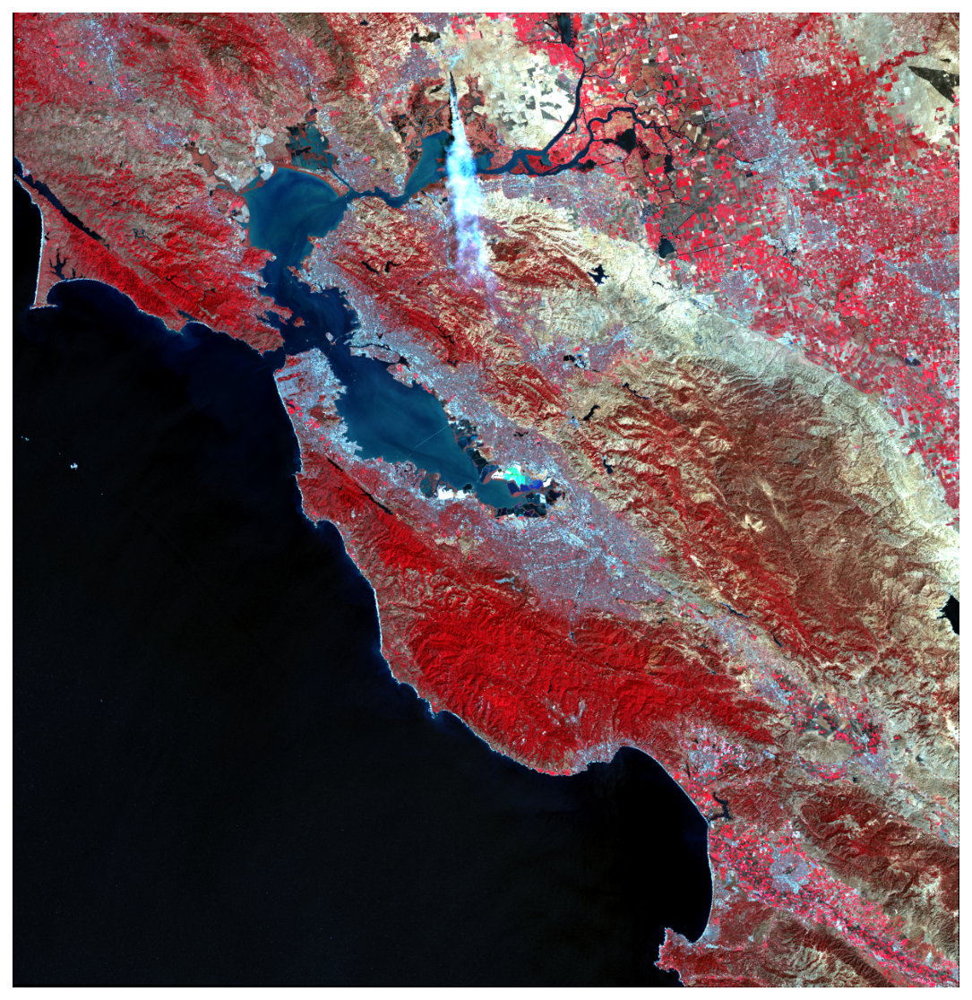

In [39]:
#bands = [4,3,2] # Natural Color 
bands = [5,4,3] # Color infrared (Vegetation) 
 
ls_false = prepare_landsat_image(bands) 
     
fig, ax = plt.subplots(1, 1, figsize=(10, 10)) 
plt.axis('off') 
plt.imshow(ls_false) 
plt.show()

In [40]:
from PIL import Image 

In [77]:
 #Load Image into PIL 
imageRGB = Image.fromarray(img_as_ubyte(ls_false)) 
N=6
imageIndexed = imageRGB.quantize(colors=N, kmeans=1)

In [78]:
PrintArrayInfo(np.array(imageIndexed))

Array info:
shape: (1256, 1221)
dtype: uint8
min, max: 0 5


In [79]:
rgbFromIndexed = imageIndexed.convert("RGB")

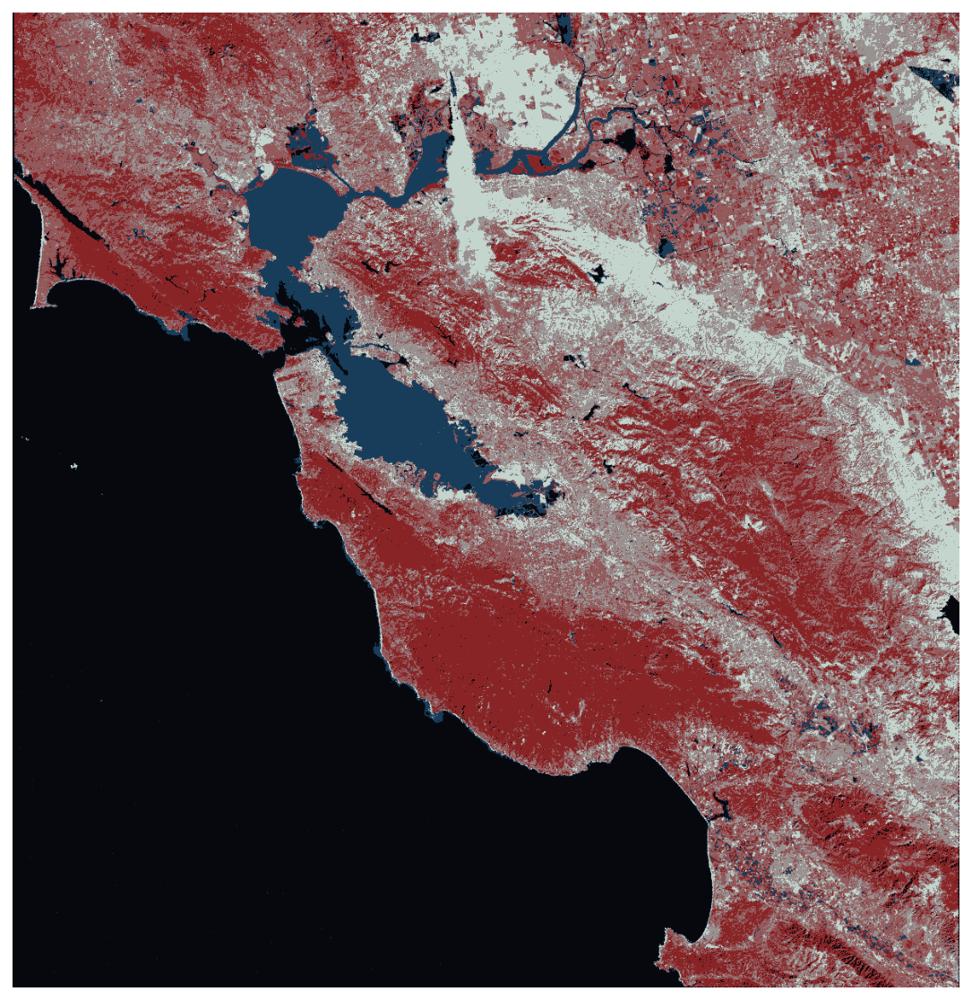

In [80]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10)) 
plt.axis('off') 
plt.imshow(rgbFromIndexed) 
plt.show()

In [81]:
rgbFromIndexed.getcolors()

[(121175, (196, 213, 206)),
 (325771, (147, 89, 91)),
 (67841, (24, 61, 90)),
 (252335, (153, 144, 144)),
 (243571, (136, 36, 38)),
 (522883, (6, 8, 13))]

In [85]:
imageIndexed.getcolors()

[(121175, 0), (252335, 1), (325771, 2), (243571, 3), (67841, 4), (522883, 5)]

In [86]:
getcolors = imageIndexed.getcolors()
getcolors2 = rgbFromIndexed.getcolors()
counts=[]
labels=[]
palettes=[]
for i in range(len(getcolors)):
    count,label = getcolors[i]
    counts.append(count)
    labels.append(label)
    for i in range(len(getcolors2)):
        count2,palette = getcolors2[i]
        if count2==count:
            palettes.append(palette)

In [87]:
from image_manipulation import bar_plot_with_colors 

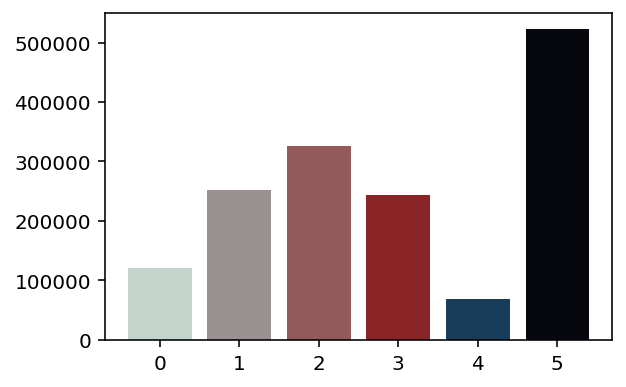

In [88]:
bar_plot_with_colors(counts,palettes,labels)